In [1]:
## Load R libraries.

inLibraries = list('repr',
                   'rgdal',
                   'gstat',
                   'spdep',
                   'rgeos',
                   'geoR',
                   'sp',
                   'RColorBrewer',
                   'classInt',
                   'MASS',
                   'forecast',
                   'raster',
                   'rgdal')

for (rpack in inLibraries) {
  if (is.element(rpack,installed.packages()[,1])){           
      #Load the library into R
      suppressMessages(library(rpack,character.only = TRUE))
    }
    else {
        print(paste("Warning:  ",rpack," is not an installed package"))
    }
}

## Resize plot area.
options(repr.plot.width=15, repr.plot.height=15)

In [2]:
# Because ANOVA indicated a possible correlation between mass and lat/long, 
# that is where I am going with my analysis next.

In [3]:
train_ff <- read.csv('data/results/traintest/meteorite_falls_and_found_train.csv')
train_ff <- subset(train_ff, select = -c(X,X.1) )

test_ff <- read.csv('data/results/traintest/meteorite_falls_and_found_test.csv')
test_ff <- subset(test_ff, select = -c(X,X.1) )

head(train_ff)
head(test_ff)

,id,recclass,mass,fell_or_found,year,latitude,longitude,group,chondrite,type,lvl3,lvl4,lc_sample,weights
,<int>,<chr>,<dbl>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>
1,11632,L4,633.00,Found,1995,28.69167,13.21967,L,Chondrite,Stony,Ordinary,L,11,0.004857815
2,2320,L6,3200.00,Fell,1803,43.86667,5.38333,L,Chondrite,Stony,Ordinary,L,12,0.497990676
3,10154,H4,0.83,Found,1992,-30.73783,127.95367,H,Chondrite,Stony,Ordinary,H,11,0.004857815
4,11542,Eucrite-mmict,143.00,Found,1994,28.94550,13.06950,Eucrite,Achondrite,Stony,Asteroidal,H-E-D Vesta,11,0.004857815
5,11944,L6,23.60,Found,1991,-30.27467,129.01850,L,Chondrite,Stony,Ordinary,L,11,0.004857815
6,45918,LL6,425.00,Found,2006,20.01352,56.40697,LL,Chondrite,Stony,Ordinary,LL,11,0.004857815


,id,recclass,mass,fell_or_found,year,latitude,longitude,group,chondrite,type,lvl3,lvl4,lc_sample,weights
,<int>,<chr>,<dbl>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>
1,4,H5,331,Found,1982,26.80000,-105.41667,H,Chondrite,Stony,Ordinary,H,2,0.463225691
2,9,H4,4500,Found,1997,27.23944,29.83583,H,Chondrite,Stony,Ordinary,H,11,0.004857815
3,12,H5,228,Found,1989,27.61667,3.85000,H,Chondrite,Stony,Ordinary,H,14,0.498018660
4,13,H5,145,Found,1989,27.81667,4.03333,H,Chondrite,Stony,Ordinary,H,14,0.498018660
5,16,H3.9/4,561,Found,1989,27.63333,3.96667,H,Chondrite,Stony,Ordinary,H,14,0.498018660
6,17,L5,542,Found,1989,27.51667,3.65000,L,Chondrite,Stony,Ordinary,L,14,0.498018660


In [4]:
## Because N must be < 5000 for kriging to work, This gives me the perfect opportunity to use my landcover weights
## for sampling. I'd like to recreate the weights to be a little simpler.
## I will select 2000 samples from the Train_ff set (5000 gives me an error: too few positive probabilities).

In [5]:
# First, let's recreate and normalize the weights column
# This is the world in 1990.

lc1990name <- "data/lc/historic_landcover_hd_1990.asc"
lc1990 <- raster(lc1990name,values=TRUE)

landcover_counts<- freq(lc1990)

total <- 259200

for (i in 1:18){
    lc_weight2 <- (landcover_counts[i,2]/total)*100
    train_ff$weights2[train_ff$lc_sample == landcover_counts[i,1]] <- lc_weight2

}

normalize <- function(x) {
return ((x - min(x)) / (max(x) - min(x)))
}

unique(train_ff$weights2)

train_ff$weights2<-normalize(train_ff$weights2)

unique(train_ff$weights2)

[1]  0.3364198  0.3572531  2.2241512  4.5821759  1.4336420  2.2827932
 [7]  0.5412809  4.0671296  1.0501543  1.8429784  0.3406636 66.3206019
[13]  1.0856481  0.7391975  0.6041667  0.7133488

[1] 0.000000e+00 3.157322e-04 2.860885e-02 6.434506e-02 1.662856e-02
 [6] 2.949758e-02 3.104700e-03 5.653946e-02 1.081675e-02 2.283212e-02
[11] 6.431583e-05 1.000000e+00 1.135467e-02 6.104157e-03 4.057744e-03
[16] 5.712415e-03

In [6]:
# Now to get a sample of 2000 rows using those weights.

set.seed(1234)

train_ff_2000 <- train_ff[sample(seq_len(nrow(train_ff)),2000,prob=train_ff$weights2),]

head(train_ff_2000)
dim(train_ff_2000)

,id,recclass,mass,fell_or_found,year,latitude,longitude,group,chondrite,type,lvl3,lvl4,lc_sample,weights,weights2
,<int>,<chr>,<dbl>,<chr>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>
2191,23091,LL3.3,24.3,Fell,1919,38.16667,-76.38333,LL,Chondrite,Stony,Ordinary,LL,0,71.3451083,1.00000000
5281,465,H4,9251.0,Fell,1900,50.95000,31.81667,H,Chondrite,Stony,Ordinary,H,2,0.4632257,0.06434506
334,12743,L6,800.0,Fell,1938,52.45000,51.56667,L,Chondrite,Stony,Ordinary,L,2,0.4632257,0.06434506
1304,16878,"Iron, IC",1143000.0,Found,1909,-29.58333,139.90000,Iron IC,Achondrite,Iron,Magmatic,Siderite,2,0.4632257,0.06434506
1218,23973,L6,218.0,Found,1888,33.46667,-82.48333,L,Chondrite,Stony,Ordinary,L,1,0.2972737,0.02949758
4067,23494,H5,1192.7,Found,1976,32.71667,-102.65000,H,Chondrite,Stony,Ordinary,H,2,0.4632257,0.06434506


[1] 2000   15

In [7]:
coordinates(train_ff_2000)<-~longitude+latitude
proj4string(train_ff_2000)<- CRS("+proj=aeqd +lon_0=0 +lat_0=0 +datum=WGS84 +units=m +no_defs")

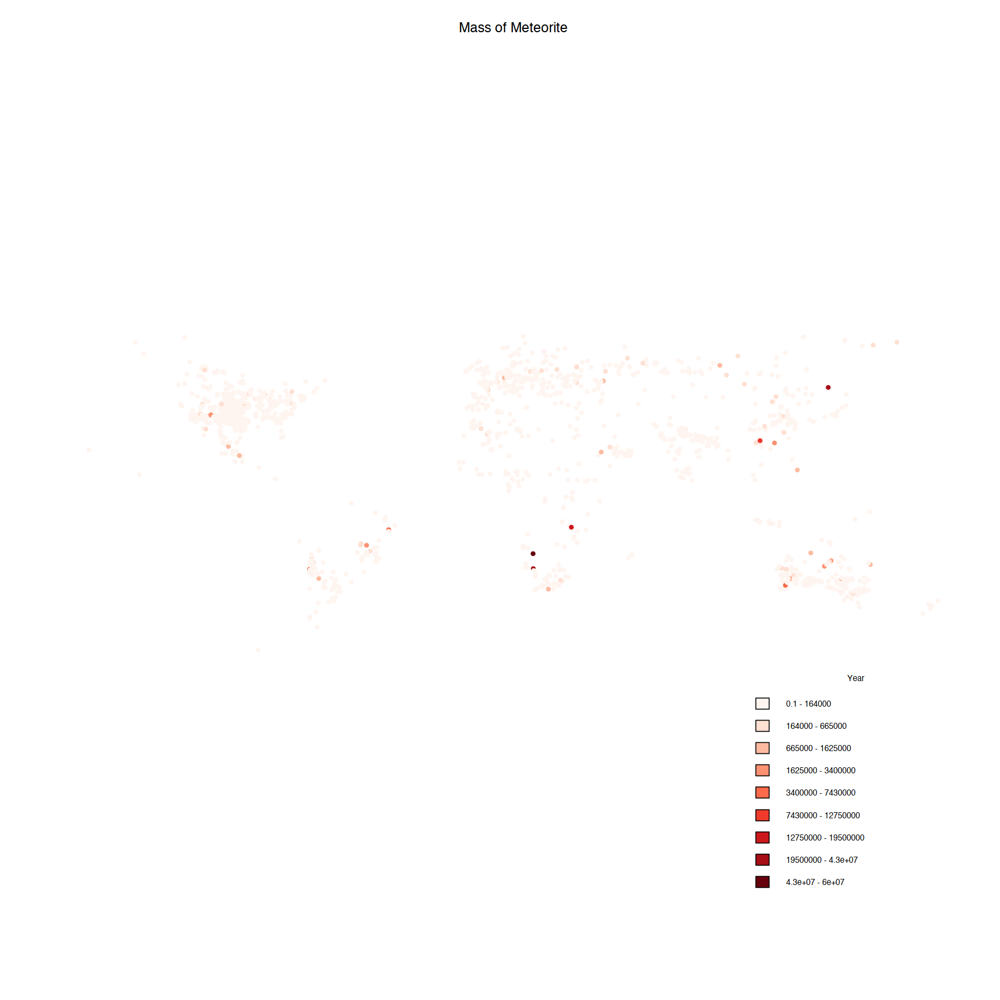

In [8]:
#Defining variable for study

inVa <- as.numeric (train_ff_2000$mass)

## Configure classification parameters.

numcat <- 9
repeattimes <- 25
cate <- classIntervals(inVa, numcat, style="kmeans",rtimes=repeattimes)

## Assign colors to categories.

pal <- brewer.pal(numcat,"Reds")
cols <- findColours(cate,pal)

## Map input data.

plot(train_ff_2000, col=cols, pch=20, main="Mass of Meteorite")

## Map classification scheme.

decimalPlaces <- 3
brks.dec <- round(cate$brks,decimalPlaces)
leg.text <- paste(brks.dec[-(numcat+1)], brks.dec[-1], sep=" - ")
legend("bottomright",fill=attr(cols,"palette"),legend=leg.text,bty="n",title="Year",cex=.7)

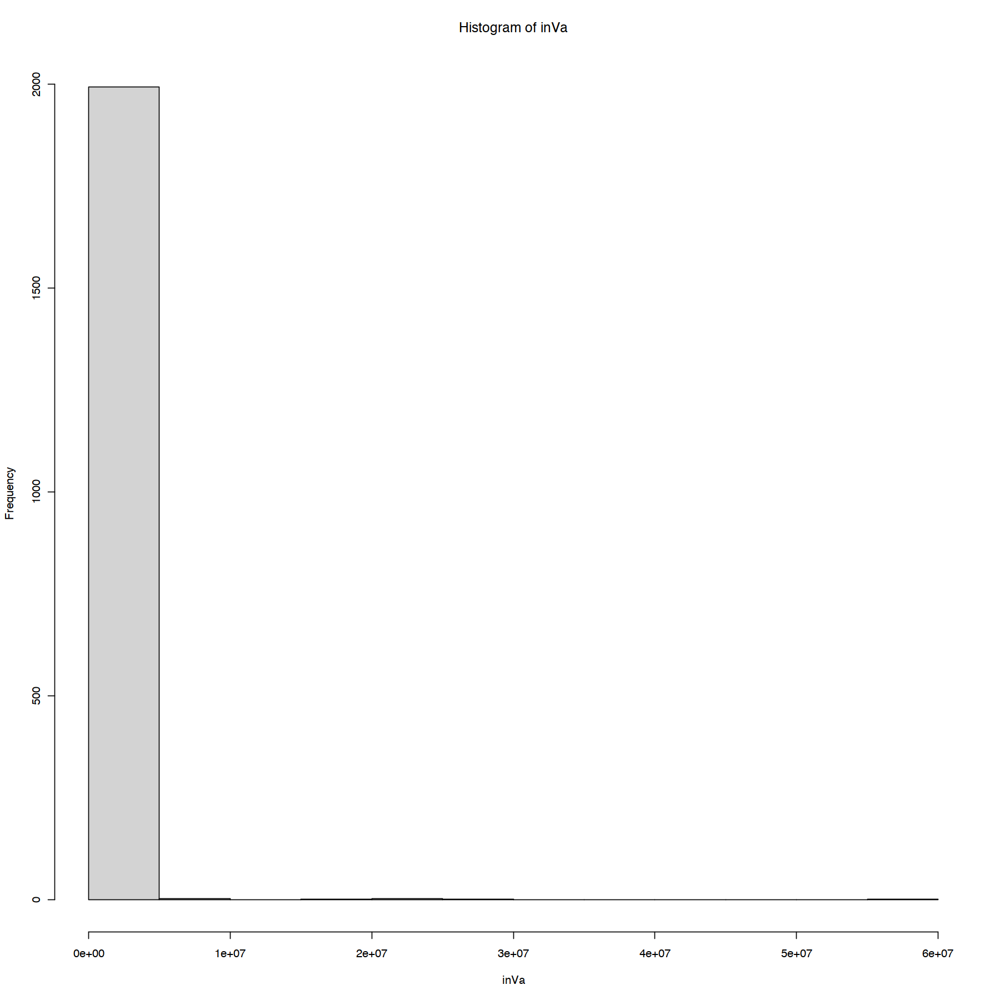

In [9]:
## Plot the density function.

hist(inVa)

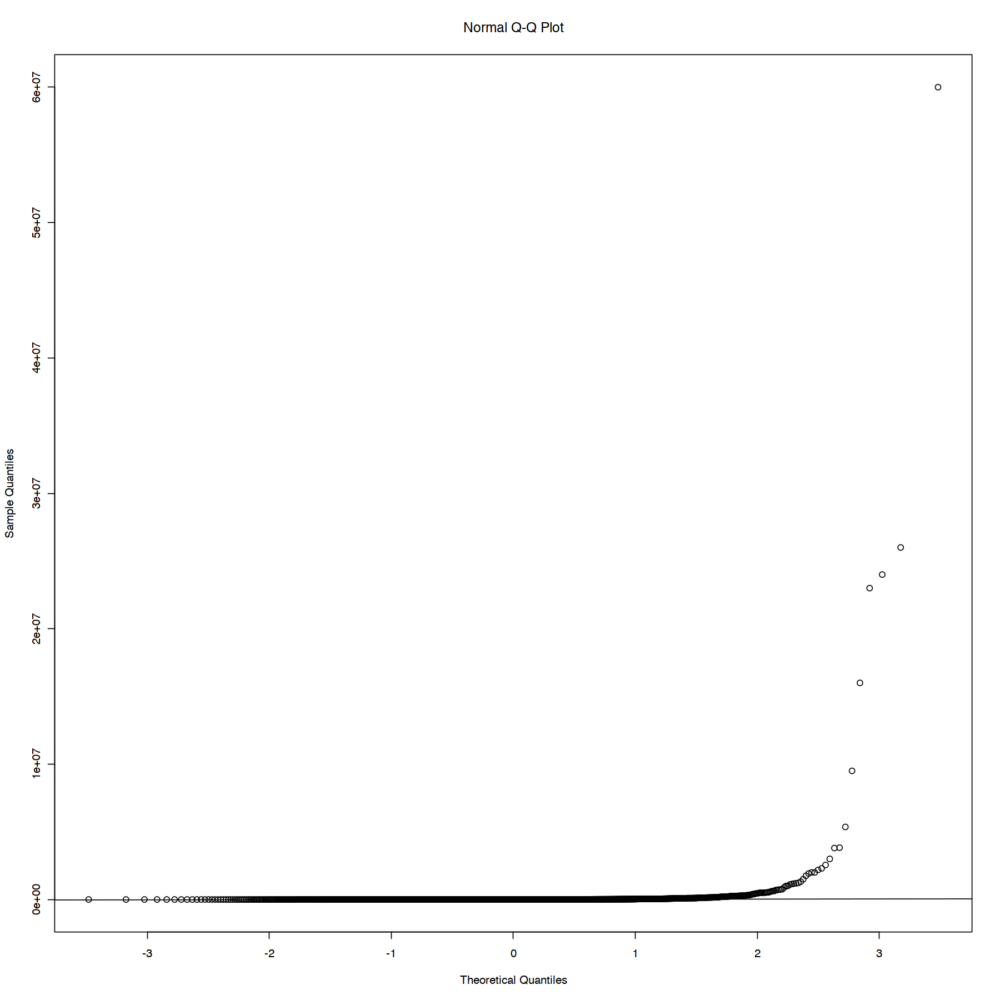

In [10]:
## Draw a qq plot.

qqnorm(inVa)

## Fit a line to the plot.

qqline(inVa)

In [62]:
# At this point I see I have some major outliers in mass throwing off my analysis.  Going to look at 1Q - 3Q only

summary(train_ff_2000)



Object of class SpatialPointsDataFrame
Coordinates:
                 min       max
longitude -157.86667 178.08333
latitude   -57.78667  66.34833
Is projected: TRUE 
proj4string :
[+proj=aeqd +lat_0=0 +lon_0=0 +x_0=0 +y_0=0 +datum=WGS84 +units=m
+no_defs]
Number of points: 2000
Data attributes:
       id          recclass              mass          fell_or_found     
 Min.   :    2   Length:2000        Min.   :       0   Length:2000       
 1st Qu.: 7776   Class :character   1st Qu.:     367   Class :character  
 Median :14762   Mode  :character   Median :    2412   Mode  :character  
 Mean   :16418                      Mean   :  124632                     
 3rd Qu.:23089                      3rd Qu.:   14808                     
 Max.   :56577                      Max.   :60000000                     
      year         group            chondrite             type          
 Min.   :1399   Length:2000        Length:2000        Length:2000       
 1st Qu.:1914   Class :character   Class 

In [65]:
train_ff_1q3q <- train_ff_2000[train_ff_2000$mass >367 & train_ff_2000$mass < 14808,]
dim(train_ff_1q3q)
head(train_ff_1q3q)

[1] 989  13

,id,recclass,mass,fell_or_found,year,group,chondrite,type,lvl3,lvl4,lc_sample,weights,weights2
,<int>,<chr>,<dbl>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>
5281,465,H4,9251.0,Fell,1900,H,Chondrite,Stony,Ordinary,H,2,0.4632257,0.06434506
334,12743,L6,800.0,Fell,1938,L,Chondrite,Stony,Ordinary,L,2,0.4632257,0.06434506
4067,23494,H5,1192.7,Found,1976,H,Chondrite,Stony,Ordinary,H,2,0.4632257,0.06434506
465,2340,H5,7450.0,Fell,1950,H,Chondrite,Stony,Ordinary,H,2,0.4632257,0.06434506
1661,12233,H6,12000.0,Found,1956,H,Chondrite,Stony,Ordinary,H,2,0.4632257,0.06434506
3853,22769,H4,7166.0,Found,1939,H,Chondrite,Stony,Ordinary,H,2,0.4632257,0.06434506


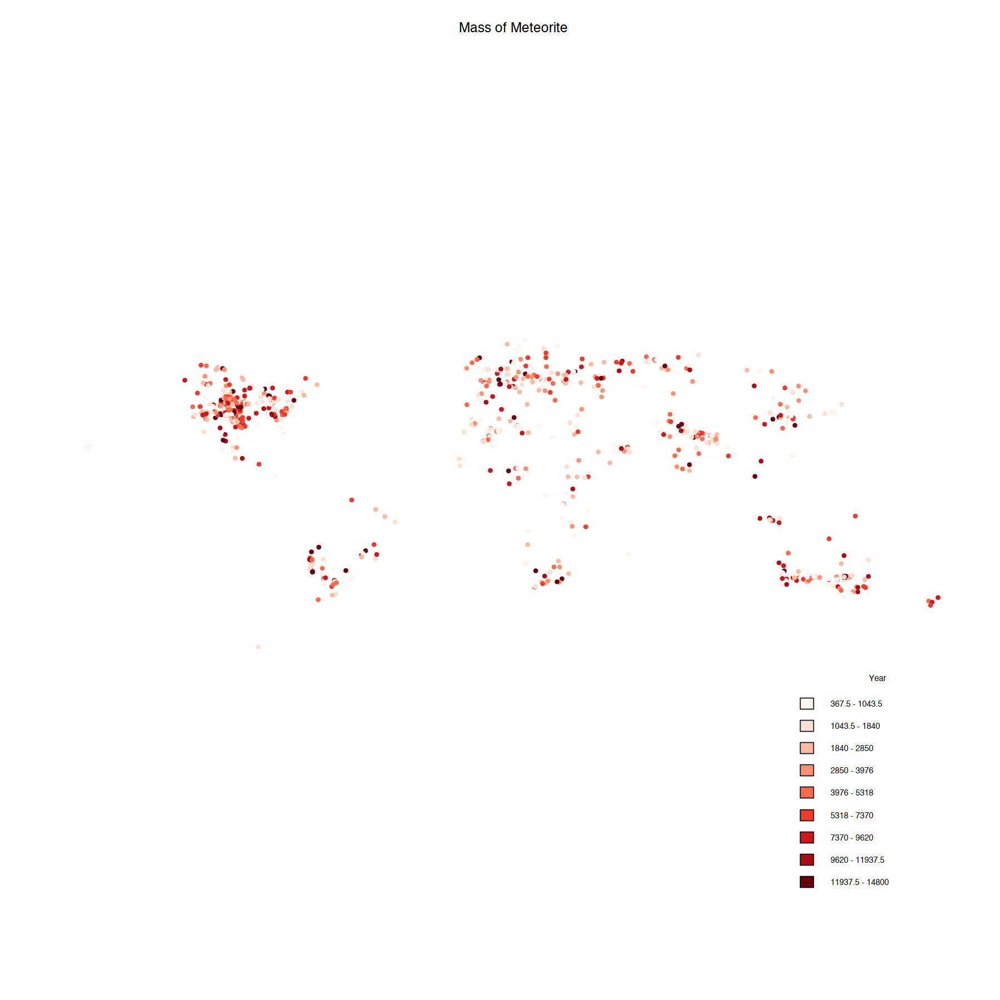

In [74]:
inVa <- as.numeric (train_ff_1q3q$mass)

numcat <- 9
repeattimes <- 25
cate <- classIntervals(inVa, numcat, style="kmeans",rtimes=repeattimes)

pal <- brewer.pal(numcat,"Reds")
cols <- findColours(cate,pal)

plot(train_ff_1q3q, col=cols, pch=20, main="Mass of Meteorite")

decimalPlaces <- 3
brks.dec <- round(cate$brks,decimalPlaces)
leg.text <- paste(brks.dec[-(numcat+1)], brks.dec[-1], sep=" - ")
legend("bottomright",fill=attr(cols,"palette"),legend=leg.text,bty="n",title="Year",cex=.7)

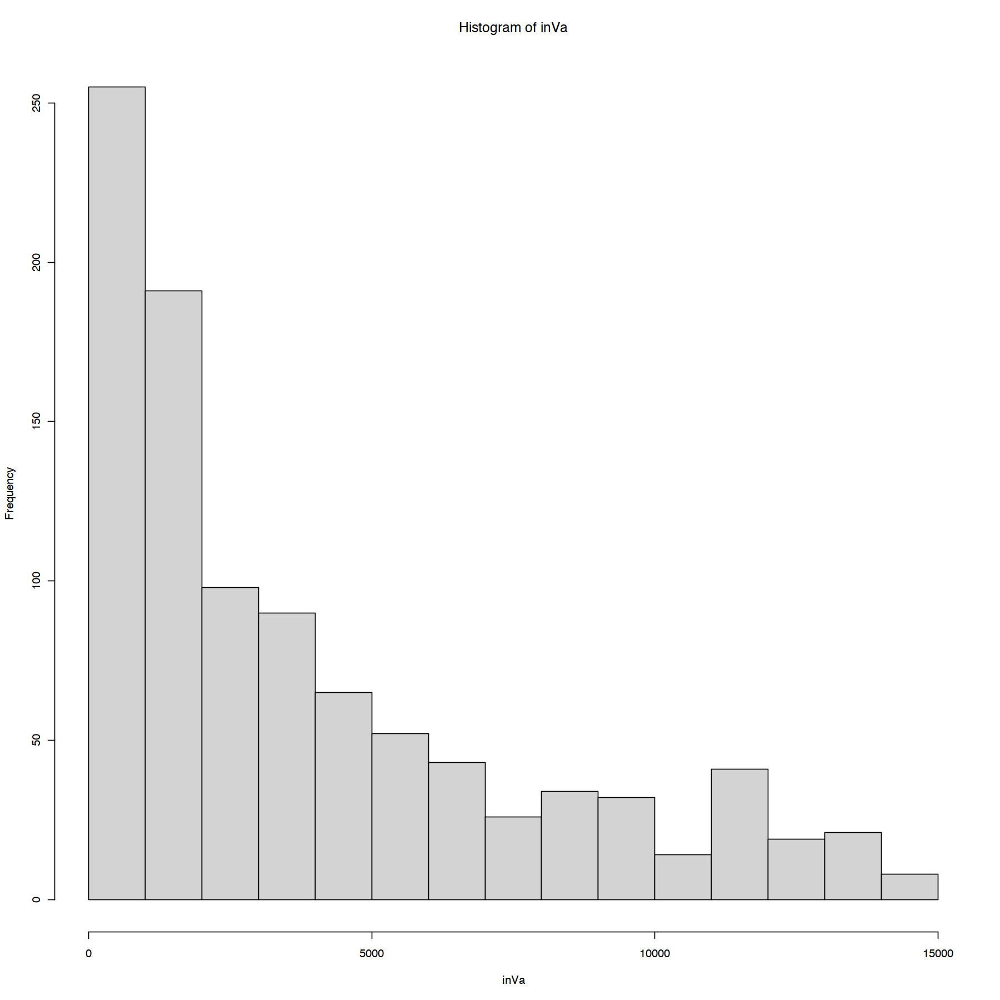

In [68]:
## Plot the density function.

hist(inVa)

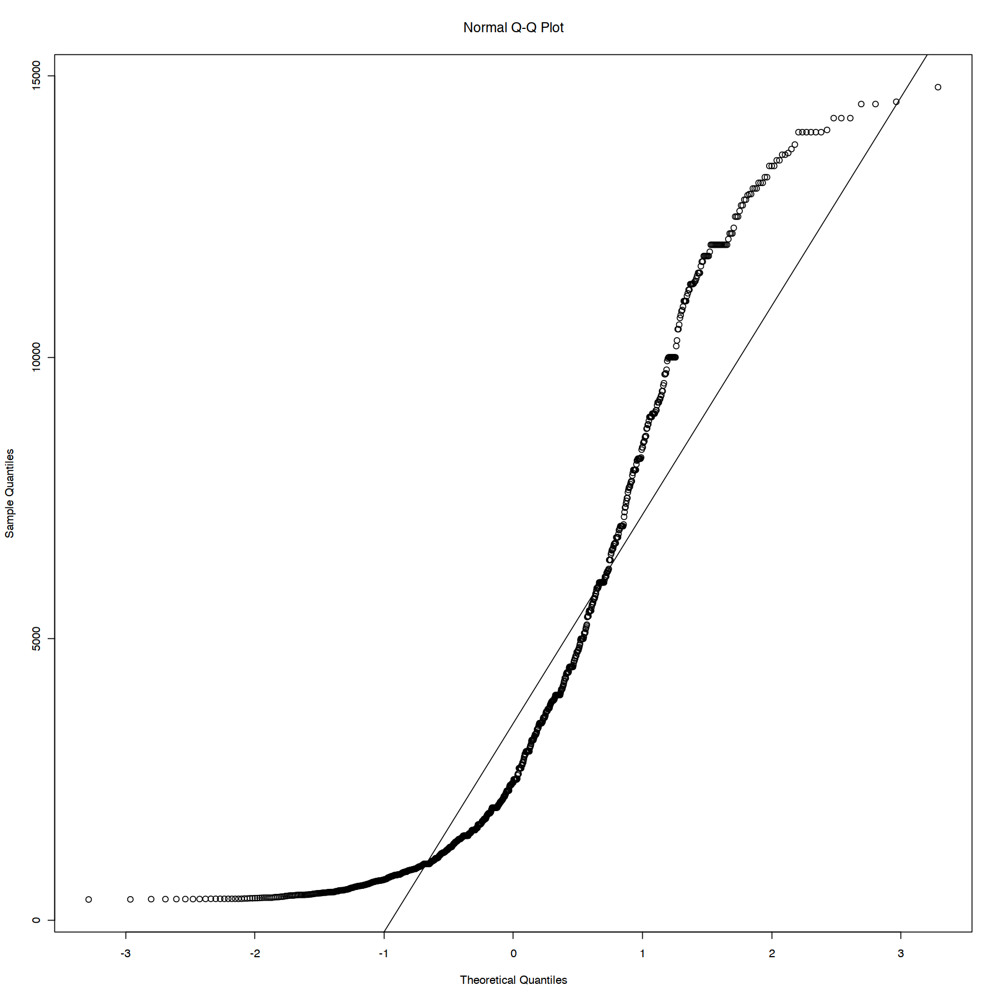

In [69]:
## Draw a qq plot.

qqnorm(inVa)

## Fit a line to the plot.

qqline(inVa)

In [70]:
shapiro.test(inVa)




	Shapiro-Wilk normality test

data:  inVa
W = 0.83846, p-value < 2.2e-16


[1] -0.2219684


	Shapiro-Wilk normality test

data:  tva
W = 0.94785, p-value < 2.2e-16


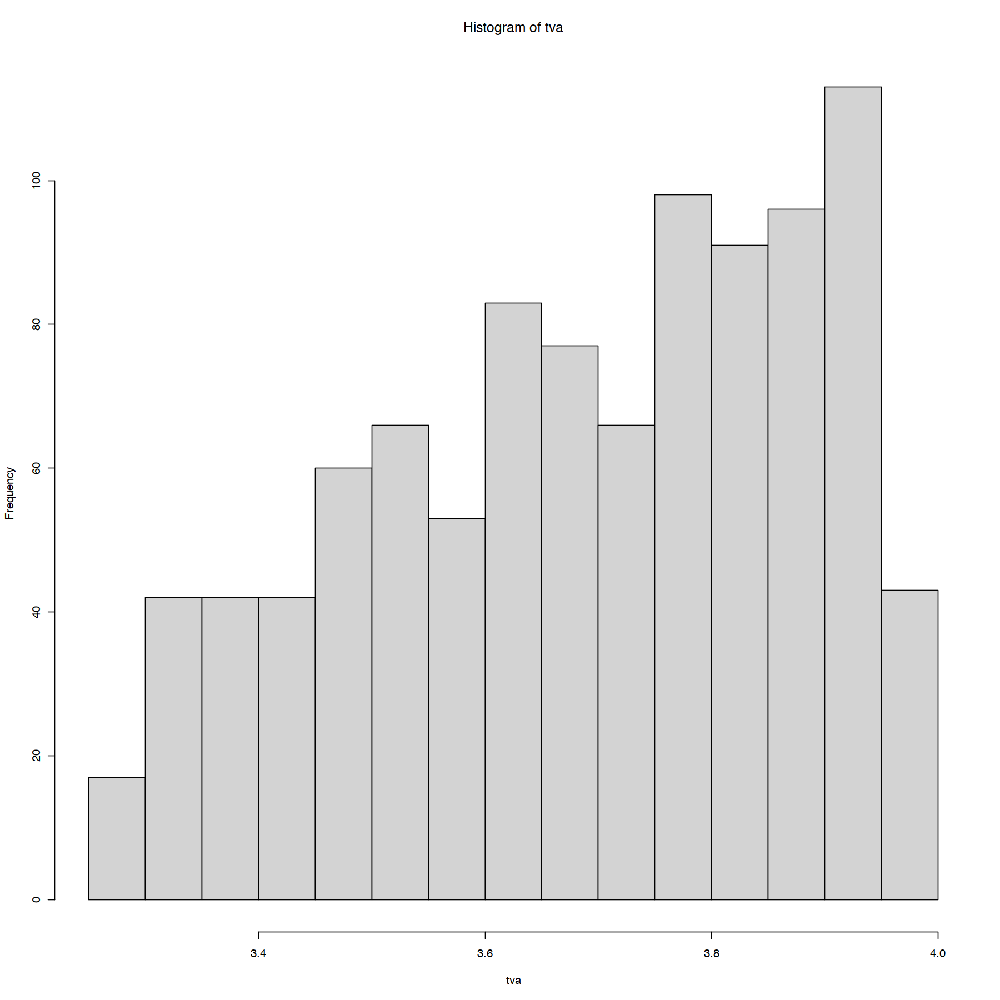

In [71]:
## Estimate lambda value for Box-Cox transformation.

lambda <- BoxCox.lambda(inVa,method = "guerrero",lower=-4,upper=4) 
lambda

## Apply a Box-Cox transformation to a variable.

tva <- BoxCox(inVa,lambda)

## Test the transformed variable.

hist(tva)
shapiro.test(tva)

Warning message in proj4string(train_ff_1q3q):
“CRS object has comment, which is lost in output”


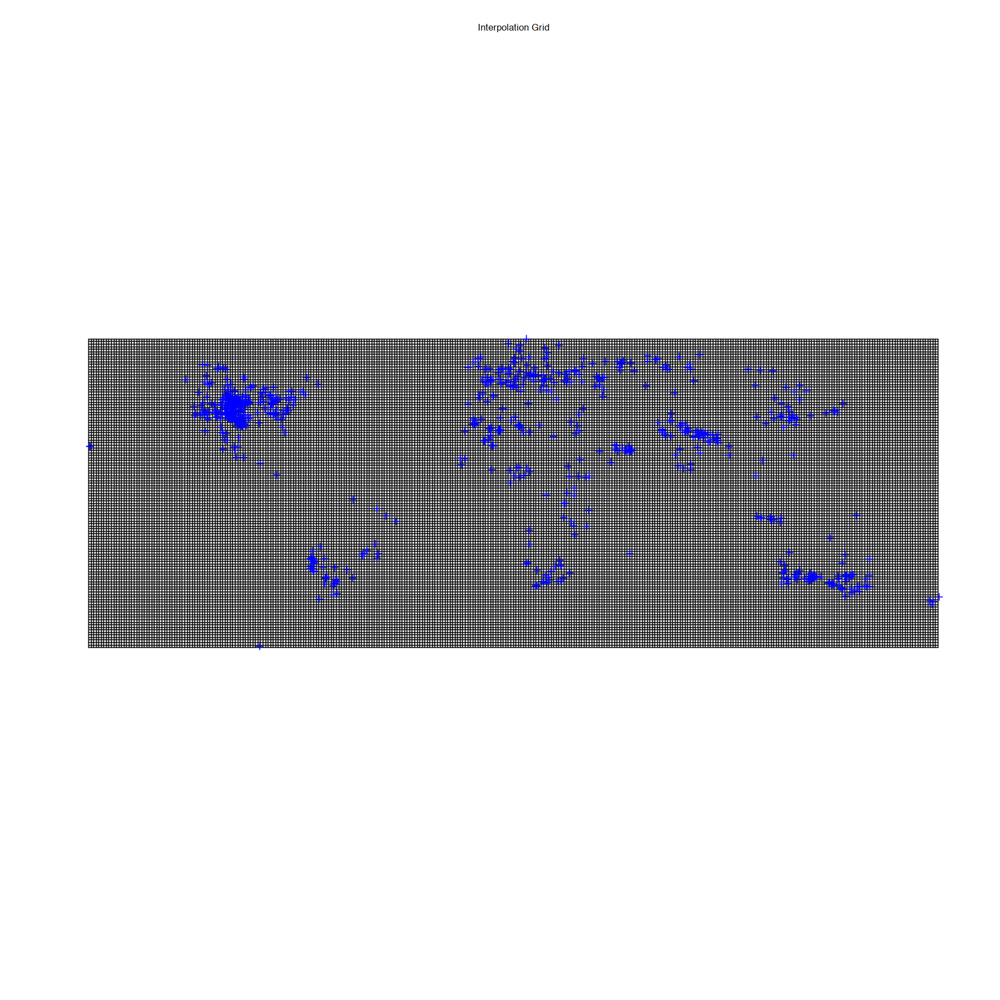

In [82]:
longmin <- min(coordinates(train_ff_1q3q)[,1])
longmax <- max(coordinates(train_ff_1q3q)[,1])
latmin  <- min(coordinates(train_ff_1q3q)[,2])
latmax  <- max(coordinates(train_ff_1q3q)[,2])

## Create a grid object

cellsize <- 10000
grd <- expand.grid(Longitude = seq(from = longmin, to = longmax), Latitude = seq(from = latmin,to = latmax))

coordinates(grd) <- ~ Longitude + Latitude

gridded(grd) <- TRUE

proj4string(grd)=proj4string(train_ff_1q3q)

plot (grd,main="Interpolation Grid",cex.main=.8)
plot(train_ff_1q3q,col="blue",add=TRUE)

,model,psill,range,kappa,ang1,ang2,ang3,anis1,anis2
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Nug,0.030529249,0.00000,0.0,0,0,0,1,1
2,Exp,0.006521003,15.51234,0.5,0,0,0,1,1


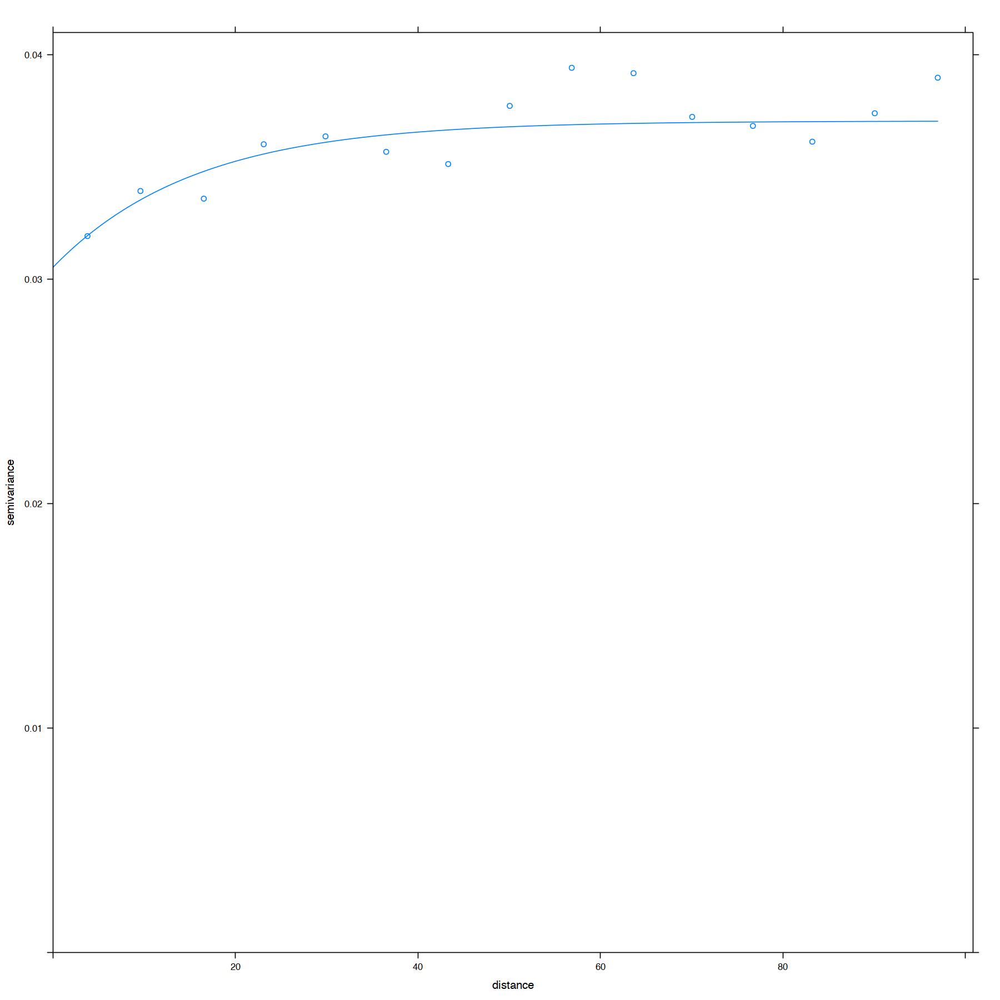

In [101]:
cutoff <- 100
range <- 50
sill <- .035
nugget <- .03

## Create an empirical variogram.

vrg <- variogram(as.numeric (tva) ~ 1, train_ff_1q3q,cutoff=cutoff)

## Fit a mathematical model (exponential) to the empirical variogram.

fit.vrg.exp <- fit.variogram(vrg, vgm(psill=sill, "Exp", range=range, nugget=nugget))

## View the estimated variogram parameters.

fit.vrg.exp

## Plot fitted variogram.

plot(vrg,fit.vrg.exp)

In [103]:
## Implement ordinary Kriging and make the prediction for the exponential form.

ok.exp <- krige(tva ~ 1, train_ff_1q3q, grd, fit.vrg.exp)

## Retrieve the interpolated files from the gridded spatialpixels data frame.

rvals <- ok.exp@data$var1.pred

## Backtransform the predicted values.

btrvals <- InvBoxCox(ok.exp@data$var1.pred, lambda)
ok.exp@data$btvar1.pred <- InvBoxCox(ok.exp@data$var1.pred, lambda)

[using ordinary kriging]


Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,-57.7867,0]: skipping...”
Warning message in predict.gstat(g,

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,-56.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g,

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,-54.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-52.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, ne

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-51.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-50.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,-49.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,-48.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,-47.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,-46.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,-45.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,-44.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,-43.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,-42.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,-41.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,-40.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,-39.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,-38.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,-37.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,-36.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,-35.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,-34.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,-33.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,-32.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,-31.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, new

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,-29.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, ne

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,-27.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, n

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,-25.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,-23.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,-22.7867,0]: skipping...”
Warning message in predict.gstat(g,

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,-21.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g,

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,-19.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-17.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, ne

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-16.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-15.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,-14.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,-13.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,-12.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,-11.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,-10.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,-9.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,-8.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,-7.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,-6.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,-5.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,-4.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,-3.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,-2.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,-1.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,-0.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

In [114]:
## Classify the predicted data values and assign a color schema.

numcat <- 2
cate <- classIntervals(btrvals, numcat, style="quantile")
color.pal <- brewer.pal(numcat,"Reds")

## Plot the Kriging estimation.

spplot(ok.exp["btvar1.pred"], col.regions= color.pal,main="Est. Values - Ord. Kriging (exp. model)",at=cate$brks,cex.main=.8,panel = function(...) {
         panel.gridplot(..., border="black")})

Warning message in classIntervals(btrvals, numcat, style = "quantile"):
“var has missing values, omitted in finding classes”
Warning message in classIntervals(btrvals, numcat, style = "quantile"):
“n greater than number of different finite values\nn reset to number of different finite values”
Warning message in classIntervals(btrvals, numcat, style = "quantile"):
“n same as number of different finite values\neach different finite value is a separate class”


ERROR: Error in sVar[1:(length(sVar) - 1)]: only 0's may be mixed with negative subscripts


,model,psill,range,kappa,ang1,ang2,ang3,anis1,anis2
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Nug,0.031020223,0.00000,0.0,0,0,0,1,1
2,Sph,0.005721553,34.43798,0.5,0,0,0,1,1


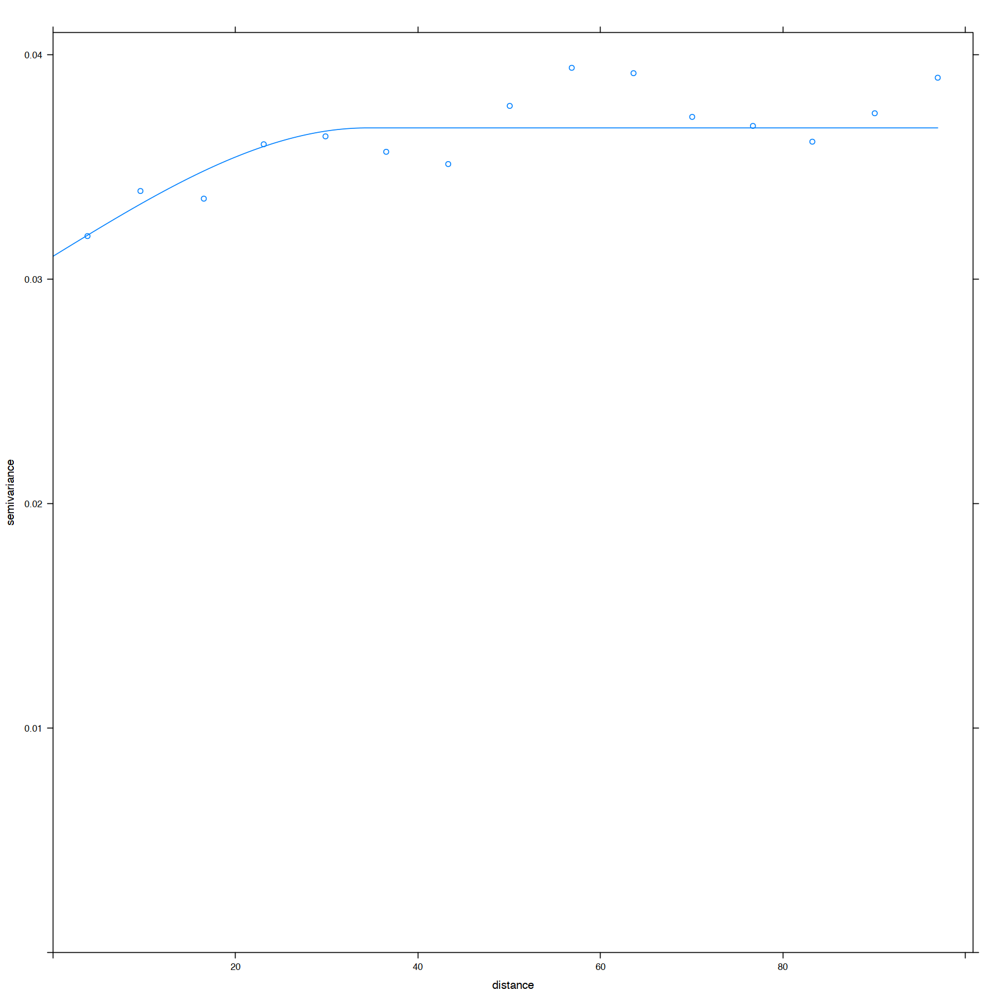

In [115]:
## Create an empirical variogram.

vrg <- variogram(as.numeric (tva) ~ 1, train_ff_1q3q,cutoff=cutoff)

## Fit a mathematical model (spherical) to the empirical variogram.

fit.vrg.sph <- fit.variogram(vrg, vgm(psill=sill, "Sph", range=range, nugget=nugget))

## View the estimated variogram parameters.

fit.vrg.sph

## Plot fitted variogram.

plot(vrg,fit.vrg.sph)

In [116]:
## Implement ordinary Kriging using the spherical variogram.

ok.sph <- krige(tva ~ 1, train_ff_1q3q, grd, fit.vrg.sph)


## Retrieve the interpolated files from the gridded spatialpixels data frame.

rvals <- ok.sph@data$var1.pred

## Backtransform the predicted values.

btrvals <- InvBoxCox(ok.sph@data$var1.pred, lambda)
ok.sph@data$btvar1.pred <- InvBoxCox(ok.sph@data$var1.pred, lambda)

[using ordinary kriging]


Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,-57.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,-57.7867,0]: skipping...”
Warning message in predict.gstat(g,

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,-57.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,-56.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,-56.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,-56.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g,

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,-55.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,-55.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,-55.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,-54.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,-54.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,-54.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-53.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-53.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-53.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-52.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-52.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,-52.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, ne

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-51.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-51.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-51.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-50.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-50.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,-50.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,-49.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,-49.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,-49.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,-48.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,-48.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,-48.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,-47.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,-47.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,-47.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,-46.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,-46.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,-46.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,-45.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,-45.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,-45.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,-44.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,-44.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,-44.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,-43.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,-43.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,-43.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,-42.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,-42.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,-42.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,-41.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,-41.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,-41.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,-40.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,-40.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,-40.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,-39.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,-39.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,-39.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,-38.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,-38.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,-38.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,-37.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,-37.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,-37.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,-36.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,-36.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,-36.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,-35.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,-35.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,-35.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,-34.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,-34.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,-34.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,-33.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,-33.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,-33.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,-32.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,-32.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,-32.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,-31.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,-31.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,-31.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, new

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,-30.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,-29.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,-29.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,-29.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, ne

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,-28.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,-27.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,-27.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,-27.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, n

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,-26.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,-25.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,-25.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,-25.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,-24.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,-24.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,-23.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,-23.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,-23.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,-22.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,-22.7867,0]: skipping...”
Warning message in predict.gstat(g,

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,-22.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,-21.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,-21.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,-21.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g,

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,-20.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,-20.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,-20.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,-19.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,-19.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,-19.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,-18.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,-18.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,-18.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,-17.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,-17.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,-17.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, ne

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,-16.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,-16.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,-16.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,-15.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,-15.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,-15.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,-14.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,-14.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,-14.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,-13.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,-13.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,-13.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,-12.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,-12.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,-12.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,-11.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,-11.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,-11.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,-10.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,-10.7867,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,-10.7867,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,-9.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,-9.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,-9.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,-8.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,-8.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,-8.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,-7.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,-7.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,-7.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,-6.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,-6.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,-6.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,-5.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,-5.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,-5.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,-4.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,-4.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,-4.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,-3.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,-3.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,-3.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,-2.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,-2.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,-2.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,-1.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,-1.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,-1.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,-0.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,-0.78667,0]: skipping...”
Warning message in predict.gstat(g

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,-0.78667,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,0.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,1.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,2.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,3.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,4.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,5.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,6.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,7.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,8.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,9.21333,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,10.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,11.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,12.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,13.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,14.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,15.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,16.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,17.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,18.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,19.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,20.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,21.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,22.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,23.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,24.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,25.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,26.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,27.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,28.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,29.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,30.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,31.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,32.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,33.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,34.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,35.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,36.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,37.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,38.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,39.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,40.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,41.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,42.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,43.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,44.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,45.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,46.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,47.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,48.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,49.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,50.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-125.867,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-124.867,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-73.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-72.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-21.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-20.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [30.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [31.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [82.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [83.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [134.133,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [135.133,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,51.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-149.867,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-148.867,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-97.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-96.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-45.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-44.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [6.13333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [7.13333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [58.1333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [59.1333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [110.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [111.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [162.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [163.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,52.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-123.867,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-122.867,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-121.867,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-120.867,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-71.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-70.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-69.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-68.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-19.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-18.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-17.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-16.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [32.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [33.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [34.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [35.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [84.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [85.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [86.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [87.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [136.133,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [137.133,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [138.133,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [139.133,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,53.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-147.867,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-146.867,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-145.867,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-144.867,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-95.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-94.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-93.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-92.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-43.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-42.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-41.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-40.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [8.13333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [9.13333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [10.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [11.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [60.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [61.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [62.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [63.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [112.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [113.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [114.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [115.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [164.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [165.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [166.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [167.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,54.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-119.867,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-118.867,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-117.867,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-116.867,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-67.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-66.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-65.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-64.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-15.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-14.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-13.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-12.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [36.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [37.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [38.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [39.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [88.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [89.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [90.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [91.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [140.133,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [141.133,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [142.133,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [143.133,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,55.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-143.867,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-142.867,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-141.867,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-140.867,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-91.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-90.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-89.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-88.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-39.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-38.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-37.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-36.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [12.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [13.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [14.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [15.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [64.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [65.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [66.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [67.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [116.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [117.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [118.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [119.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [168.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [169.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [170.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [171.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,56.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-115.867,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-114.867,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-113.867,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-112.867,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-63.8667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-62.8667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-61.8667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-60.8667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-11.8667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-10.8667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-9.86667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-8.86667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [40.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [41.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [42.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [43.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [92.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [93.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [94.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [95.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [144.133,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [145.133,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [146.133,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [147.133,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,57.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-139.867,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-138.867,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-137.867,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-136.867,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-87.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-86.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-85.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-84.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-35.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-34.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-33.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-32.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [16.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [17.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [18.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [19.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [68.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [69.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [70.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [71.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [120.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [121.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [122.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [123.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [172.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [173.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [174.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [175.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,58.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-111.867,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-110.867,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-109.867,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-108.867,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-59.8667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-58.8667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-57.8667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-56.8667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-7.86667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-6.86667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-5.86667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-4.86667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [44.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [45.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [46.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [47.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [96.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [97.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [98.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [99.1333,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [148.133,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [149.133,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [150.133,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [151.133,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,59.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-135.867,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-134.867,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-133.867,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-132.867,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-83.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-82.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-81.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-80.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-31.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-30.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-29.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-28.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [20.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [21.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [22.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [23.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [72.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [73.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [74.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [75.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [124.133,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [125.133,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [126.133,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [127.133,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [176.133,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [177.133,60.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-157.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-156.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-107.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-106.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-105.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-104.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-55.8667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-54.8667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-53.8667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-52.8667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-3.86667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-2.86667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-1.86667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-0.86667,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdat

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [48.1333,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [49.1333,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [50.1333,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [51.1333,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [100.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [101.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [102.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [103.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [152.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [153.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [154.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [155.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,61.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-131.867,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-130.867,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-129.867,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-128.867,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-127.867,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-126.867,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-79.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-78.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-77.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-76.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-75.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-74.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-27.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-26.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-25.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-24.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-23.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-22.8667,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [24.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [25.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [26.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [27.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [28.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [29.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [76.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [77.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [78.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [79.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [80.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [81.1333,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [128.133,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [129.133,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [130.133,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [131.133,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [132.133,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [133.133,62.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-155.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-154.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-153.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-152.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-151.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-150.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-103.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-102.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-101.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-100.867,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-99.8667,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-98.8667,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-51.8667,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-50.8667,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-49.8667,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-48.8667,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-47.8667,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [-46.8667,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newd

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [0.13333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [1.13333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [2.13333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [3.13333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [4.13333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [5.13333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [52.1333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [53.1333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [54.1333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [55.1333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [56.1333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [57.1333,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [104.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [105.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [106.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [107.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [108.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [109.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [156.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [157.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [158.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [159.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [160.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = newdata, block = block, nsim = nsim, :
“Covariance matrix singular at location [161.133,63.2133,0]: skipping...”
Warning message in predict.gstat(g, newdata = 

In [117]:
## Classify the predicted data values and assign a color schema.

numcat <- 6
cate <- classIntervals(btrvals, numcat, style="kmeans")
color.pal <- brewer.pal(numcat,"Reds")

## Plot the Kriging estimation.

spplot(ok.sph["btvar1.pred"], col.regions= color.pal,main="Est. Values - Ord. Kriging (sph. model)",at=cate$brks,cex.main=.8,panel = function(...) {
         panel.gridplot(..., border="black")})

Warning message in classIntervals(btrvals, numcat, style = "kmeans"):
“var has missing values, omitted in finding classes”
Warning message in classIntervals(btrvals, numcat, style = "kmeans"):
“n greater than number of different finite values\nn reset to number of different finite values”
Warning message in classIntervals(btrvals, numcat, style = "kmeans"):
“n same as number of different finite values\neach different finite value is a separate class”


ERROR: Error in sVar[1:(length(sVar) - 1)]: only 0's may be mixed with negative subscripts


In [ ]:
#Hmmm..... not sure where to go now.